In [ ]:
# Header.

# ipython configuration (reloads source code automatically and plots inline)
%load_ext autoreload
%autoreload 2
%matplotlib inline

import os, sys, time
import numpy as np
import cv2
import scipy.ndimage as ndimage

import warnings
warnings.filterwarnings("ignore")

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.rc('image', cmap='Blues')

# Add slmsuite to the python path. TODO: Remove and replace with package import
sys.path.append(os.path.join(os.getcwd(), '../../..'))

from slmsuite.holography import analysis, toolbox
from slmsuite.hardware.slms.santec import Santec
from slmsuite.hardware.cameras import AlliedVision
from slmsuite.hardware.cameraslms import FourierSLM
from slmsuite.holography.algorithms import FeedbackHologram, SpotHologram

# Function to load logos
def load_img(path, target_shape=None, angle=0, shift=(-200, 0), plot=False):
    # Load the image.
    img = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

    if img is None:
        raise ValueError("Image not found at path '{}'".format(path))

    # Invert if necessary such that the majority of the image is dark.
    if np.mean(img) > np.mean(cv2.bitwise_not(img)):
        img = cv2.bitwise_not(img)

    if angle != 0:
        img = ndimage.rotate(img, angle)

    if target_shape is not None:
        zoom_x = target_shape[0] / img.shape[0]
        zoom_y = target_shape[1] / img.shape[1]
        img = ndimage.zoom(img, min(zoom_x, zoom_y))

    # sqrt to get the amplitude.
    target_ij = toolbox.pad(analysis._make_8bit(np.sqrt(img)), fs.cam.shape)

    # Shift to the desired center.
    target_ij = np.roll(target_ij, shift, axis=(0,1))

    if plot:
        plot_img(target_ij)
        plt.show()

    return target_ij

def plot_img(target_ij):
    # Plot the desired camera space.
    plt.figure(figsize=(20,10))
    plt.imshow(target_ij)
    plt.plot(target_ij.shape[1]/2, target_ij.shape[0]/2, 'r*')

def load_composite_img(paths, plot=True):
    N = len(paths)

    shape0 = fs.cam.shape
    shape = (int(shape0[0]/3), int(shape0[1]))

    result = toolbox.lloyds_points(shape, N, iterations=50, plot=False)
    toolbox.voronoi_windows(shape, result, plot=True)
    max_size = toolbox.smallest_distance(result)
    final = None

    for index, path in enumerate(paths):
        img = load_img(
            path, 
            target_shape=(max_size, max_size), 
            shift=(int(result[1, index] - shape[0]/2), int(result[0, index] - shape[1]/2))
        )

        if final is None:
            final = img
        else:
            final += img

    final = np.roll(toolbox.pad(final, shape0), shift=(-int(shape0[0] / 4), 0), axis=(0,1))

    plot_img(final)

    # for index, path in enumerate(paths):
    #     plt.annotate(path,
    #         (int(result[1, index] - shape[0]/2), int(result[0, index] - shape[1]/2)),
    #         c="r", size="x-small", ha="center")

    plt.show()

    return final
    
cyi = 90
cyf = 453

def plot_data(title=' Computational', cyi=0, cyf=-1):
    fs.slm.write(hologram.extract_phase(), settle=True)

    img = fs.cam.get_image()

    # limits = hologram.plot_farfield(hologram.weights, title='Weights' + title)
    # hologram.plot_farfield(hologram.ijcam_to_knmslm(img), limits=limits, title='Exp. Result' + title)
    
    imgs[title.strip()] = img[cyi:cyf, :]

    plt.figure(figsize=(24, 12))
    plt.imshow(imgs[title.strip()])
    plt.show()

def plot_target(target, title='Target'):
    plt.figure(figsize=(24, 12))
    plt.imshow(target[cyi:cyf, :])
    plt.show()

shape = (2048, 2048)

screenmirrored.py: pyglet not installed. Install to use ScreenMirrored SLMs.
filr.py: PySpin not installed. Install to use FLIR cameras.
thorlabs.py: thorlabs_tsi_sdk not installed. Install to use Thorlabs cameras.


In [ ]:
def plot_phase(phase, title="", zoom=True, save=""):
    # One plot if no camera; two otherwise.
    _, axs = plt.subplots(1, 2 - (cam is None), figsize=((24, 8) if len(save) > 0 else (12, 4)), gridspec_kw={"width_ratios": (.6, .4)}, facecolor="white")

    if cam is None:
        axs = [axs]
    
    # Plot the phase.
    axs[0].set_title("SLM Phase")
    im = axs[0].imshow(
        np.mod(phase, 2*np.pi), 
        vmin=0,
        vmax=2*np.pi, 
        interpolation="none", 
        cmap="Blues"
    )
    plt.colorbar(im, ax=axs[0])
    
    # Grab an image of the resulting pattern and plot.
    slm.write(phase, settle=True)
    img = cam.get_image()

    axs[1].set_title("Camera Result")
    axs[1].imshow(img)
    if zoom:
        xlim = axs[1].get_xlim()
        ylim = axs[1].get_ylim()
        # axs[1].set_xlim([xlim[0] * .7 + xlim[1] * .3, xlim[0] * .3 + xlim[1] * .7])
        # axs[1].set_ylim([ylim[0] * .7 + ylim[1] * .3, ylim[0] * .3 + ylim[1] * .7])
        # axs[1].set_xlim([xlim[0] * .6 + xlim[1] * .4, xlim[0] * .4 + xlim[1] * .6])
        # axs[1].set_ylim([ylim[0] * .6 + ylim[1] * .4, ylim[0] * .4 + ylim[1] * .6])
        axs[1].set_xlim([650, 800])
        axs[1].set_ylim([625, 500])

    # Make a title, if given.
    plt.suptitle(title)

    if len(save) > 0:
        plt.savefig(save)
        plt.close()
    else:
        plt.show()

#### Loading Hardware

**Cameras** and **SLMs** are connected to python by a myriad of SDKs, often provided by hardware
vendors. However, these SDKs likewise have a myriad of function names and hardware-specific
quirks. Thus, hardware in `slmsuite` is integrated as subclasses of
the abstract classes `.Camera` and `.SLM`.
These subclasses for [cameras](https://slmsuite.readthedocs.io/en/latest/_autosummary/slmsuite.hardware.cameras.html) 
and [slms](https://slmsuite.readthedocs.io/en/latest/_autosummary/slmsuite.hardware.slms.html)
are effectively wrappers for given SDKs, implemented with standardized methods and syntax that the rest of `slmsuite` can understand, but also include
quality-of-life features.
If you believe your camera or SLM is not supported by the currently available classes, please 
[open a GitHub issue](https://github.com/QPG-MIT/slmsuite/issues) 
or [feel free to write an interface yourself](https://github.com/QPG-MIT/slmsuite/blob/main/CONTRIBUTING.md)!

First, let's load an SLM. We're running this notebook with a `Santec` SLM.
We can find connected displays with the `.info()` static method.

In [ ]:
from slmsuite.hardware.slms.santec import Santec
Santec.info(verbose=True);

Displays detected by Santec
display_number, display_name:
1,  HP S2231,HWP,2905,3CQ02001CN
2,  LCOS-SLM,SOC,8001,2018021001


We see that `display_number=2` is the display with the LCoS SLM. We're running this setup with a 633 nm HeNe laser. All functions are documented, including the below 
[initializer](https://slmsuite.readthedocs.io/en/latest/_autosummary/slmsuite.hardware.slms.santec.Santec.html#slmsuite.hardware.slms.santec.Santec.__init__).

In [ ]:
slm = Santec(slm_number=1, display_number=2, wav_um=.633)

Santec slm_number=1 initializing... success
Looking for display_number=2... success
Opening LCOS-SLM,SOC,8001,2018021001... success


Next, let's load a camera. We're running this notebook with a `AlliedVision` camera. We can find connected cameras with the `.info()` static method.

In [ ]:
from slmsuite.hardware.cameras.alliedvision import AlliedVision
AlliedVision.info(verbose=True);

AlliedVision serials:
"02C5V"
"08-406808001844"


We want the `"02C5V"` serial.

In [ ]:
cam = AlliedVision(serial="02C5V", verbose=True)

vimba initializing... success
Looking for cameras... success
vimba sn 02C5V initializing... success


Lastly, we'll make a [class for our composite optical system](https://slmsuite.readthedocs.io/en/latest/_autosummary/slmsuite.hardware.cameraslms.FourierSLM.html#slmsuite.hardware.cameraslms.FourierSLM), 
consisting of the camera and the SLM. We'll also load a previously-measured 
[wavefront calibration](https://slmsuite.readthedocs.io/en/latest/_autosummary/slmsuite.hardware.cameraslms.FourierSLM.html#slmsuite.hardware.cameraslms.FourierSLM.wavefront_calibrate)
(we'll come back to this!).

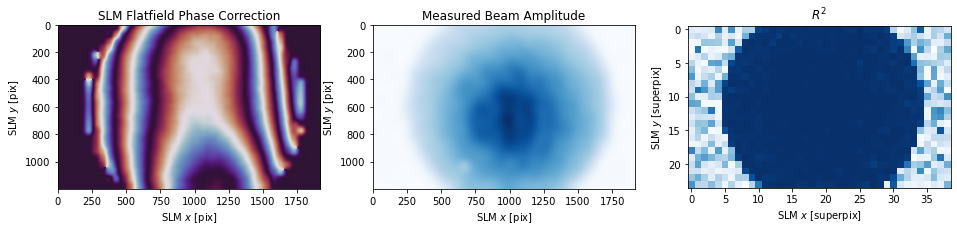

In [ ]:
from slmsuite.hardware.cameraslms import FourierSLM
fs = FourierSLM(cam, slm)
fs.load_wavefront_calibration(plot=True);    # We'll come back to this!

In [ ]:
G = np.sin(np.linspace(0, 2*np.pi, 40, endpoint=False)) / 1e7

for ii, g in enumerate(G):
    lens_phase = toolbox.lens(grid=slm, f=1/g)
    if np.isclose(g, 0):
        title = r"$f \approx ---.-$ m".format((1/g) * 1e-6 / slm.wav_um)
    else:
        title = r"$f \approx {:3.1f}$ m".format((1/g) * 1e-6 / slm.wav_um)
    plot_phase(lens_phase, title=title, save="{}.png".format(ii))

In [ ]:
import imageio
images = []
for filename in ["{}.png".format(ii) for ii in range(40)]:
    images.append(imageio.imread(filename))
imageio.mimsave('lens_movie2.gif', images)

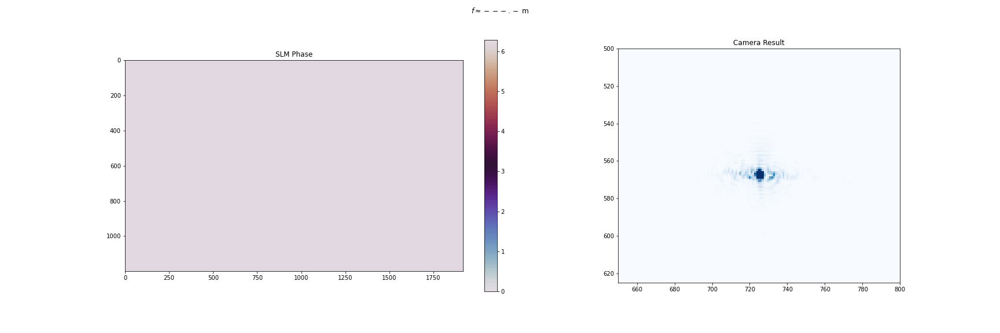

In [ ]:
from IPython.display import Image
Image(filename="lens_movie2.gif")